
# Project:TMDB_Movies Data Ananlysis

## Table of Contents
<ul>
<li><a href="#intro">Introduction</a></li>
<li><a href="#wrangling">Data Wrangling</a></li>
<li><a href="#eda">Exploratory Data Analysis</a></li>
<li><a href="#conclusions">Conclusions</a></li>
</ul>

<a id='intro'></a>
## Introduction
Dear community,

Hope you are well. In this area I want to clarify information about the dataset I used, some questions I posed to investigate it, and also communicate my results of the investigation. In this project, I will analyze the TMD-movie dataset to communicate useful results that help to explore important information that will help to find answers to our questions and maybe taking some decisions. Here I will mention a number of questions I posed to investigate the dataset and why some movies are successful and others are not. That depends on some metrics will discuss through our questions.

.........................................

.....................................................

1- What amount of budget is spent on movies over years ?

2- What is the revenue return of movies over years ?

3- What genres movie is most liked by people ?

4- Who is the cast that most liked by people ?

5- What is the number of movie genres production compared throughout years ?

6- What genres of movies are producted compared throughout years ?

7- Who is the most director liked by people?

8- What is the movies that have the highest revenue ?

9- What is the movies that have the highest budget  ?

10- How can movie popularity affects on movie profits ?

11- What is the effection of the runtime of the movie on its popularity ?

12- What is the relation between budget and revenue ?





 Firstly......
 Importing some useful libiraries for our investigation.
 

In [1]:

%matplotlib inline
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


<a id='wrangling'></a>
## Data Wrangling
 
 Secondly, I am going to load my dataset, assess it to check for any issues, and do cleaning operations to get clear and clean data for appropriate investigation.

### General Properties

In [2]:
# Load your data and print out a few lines. Perform operations to inspect data
#   types and look for instances of missing or possibly errant data.
df = pd.read_csv('tmdb-movies.csv')
df.head()


,id,imdb_id,popularity,budget,revenue,original_title,cast,homepage,director,tagline,...,overview,runtime,genres,production_companies,release_date,vote_count,vote_average,release_year,budget_adj,revenue_adj
0,135397,tt0369610,32.985763,150000000,1513528810,Jurassic World,Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vi...,http://www.jurassicworld.com/,Colin Trevorrow,The park is open.,...,Twenty-two years after the events of Jurassic ...,124,Action|Adventure|Science Fiction|Thriller,Universal Studios|Amblin Entertainment|Legenda...,6/9/15,5562,6.5,2015,1.379999e+08,1.392446e+09
1,76341,tt1392190,28.419936,150000000,378436354,Mad Max: Fury Road,Tom Hardy|Charlize Theron|Hugh Keays-Byrne|Nic...,http://www.madmaxmovie.com/,George Miller,What a Lovely Day.,...,An apocalyptic story set in the furthest reach...,120,Action|Adventure|Science Fiction|Thriller,Village Roadshow Pictures|Kennedy Miller Produ...,5/13/15,6185,7.1,2015,1.379999e+08,3.481613e+08
2,262500,tt2908446,13.112507,110000000,295238201,Insurgent,Shailene Woodley|Theo James|Kate Winslet|Ansel...,http://www.thedivergentseries.movie/#insurgent,Robert Schwentke,One Choice Can Destroy You,...,Beatrice Prior must confront her inner demons ...,119,Adventure|Science Fiction|Thriller,Summit Entertainment|Mandeville Films|Red Wago...,3/18/15,2480,6.3,2015,1.012000e+08,2.716190e+08
3,140607,tt2488496,11.173104,200000000,2068178225,Star Wars: The Force Awakens,Harrison Ford|Mark Hamill|Carrie Fisher|Adam D...,http://www.starwars.com/films/star-wars-episod...,J.J. Abrams,Every generation has a story.,...,Thirty years after defeating the Galactic Empi...,136,Action|Adventure|Science Fiction|Fantasy,Lucasfilm|Truenorth Productions|Bad Robot,12/15/15,5292,7.5,2015,1.839999e+08,1.902723e+09
4,168259,tt2820852,9.335014,190000000,1506249360,Furious 7,Vin Diesel|Paul Walker|Jason Statham|Michelle ...,http://www.furious7.com/,James Wan,Vengeance Hits Home,...,Deckard Shaw seeks revenge against Dominic Tor...,137,Action|Crime|Thriller,Universal Pictures|Original Film|Media Rights ...,4/1/15,2947,7.3,2015,1.747999e+08,1.385749e+09


* checking data shape number of columns and rows that contain this data.

In [3]:
df.shape

(10866, 21)

* Doing some descriptive statistics.

In [4]:
df.describe()

,id,popularity,budget,revenue,runtime,vote_count,vote_average,release_year,budget_adj,revenue_adj
count,10866.000000,10866.000000,1.086600e+04,1.086600e+04,10866.000000,10866.000000,10866.000000,10866.000000,1.086600e+04,1.086600e+04
mean,66064.177434,0.646441,1.462570e+07,3.982332e+07,102.070863,217.389748,5.974922,2001.322658,1.755104e+07,5.136436e+07
std,92130.136561,1.000185,3.091321e+07,1.170035e+08,31.381405,575.619058,0.935142,12.812941,3.430616e+07,1.446325e+08
min,5.000000,0.000065,0.000000e+00,0.000000e+00,0.000000,10.000000,1.500000,1960.000000,0.000000e+00,0.000000e+00
25%,10596.250000,0.207583,0.000000e+00,0.000000e+00,90.000000,17.000000,5.400000,1995.000000,0.000000e+00,0.000000e+00
50%,20669.000000,0.383856,0.000000e+00,0.000000e+00,99.000000,38.000000,6.000000,2006.000000,0.000000e+00,0.000000e+00
75%,75610.000000,0.713817,1.500000e+07,2.400000e+07,111.000000,145.750000,6.600000,2011.000000,2.085325e+07,3.369710e+07
max,417859.000000,32.985763,4.250000e+08,2.781506e+09,900.000000,9767.000000,9.200000,2015.000000,4.250000e+08,2.827124e+09


* checking some information about data 

In [5]:
#Displaying info about data.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10866 entries, 0 to 10865
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    10866 non-null  int64  
 1   imdb_id               10856 non-null  object 
 2   popularity            10866 non-null  float64
 3   budget                10866 non-null  int64  
 4   revenue               10866 non-null  int64  
 5   original_title        10866 non-null  object 
 6   cast                  10790 non-null  object 
 7   homepage              2936 non-null   object 
 8   director              10822 non-null  object 
 9   tagline               8042 non-null   object 
 10  keywords              9373 non-null   object 
 11  overview              10862 non-null  object 
 12  runtime               10866 non-null  int64  
 13  genres                10843 non-null  object 
 14  production_companies  9836 non-null   object 
 15  release_date       

* looking for duplicated data 

In [6]:
# display duplicate values
df[df.duplicated()]


,id,imdb_id,popularity,budget,revenue,original_title,cast,homepage,director,tagline,...,overview,runtime,genres,production_companies,release_date,vote_count,vote_average,release_year,budget_adj,revenue_adj
2090,42194,tt0411951,0.59643,30000000,967000,TEKKEN,Jon Foo|Kelly Overton|Cary-Hiroyuki Tagawa|Ian...,NaN,Dwight H. Little,Survival is no game,...,"In the year of 2039, after World Wars destroy ...",92,Crime|Drama|Action|Thriller|Science Fiction,Namco|Light Song Films,3/20/10,110,5.0,2010,30000000.0,967000.0


In [7]:
#counting duplicated values
sum(df.duplicated())

1

* Looking for missing data

In [8]:
#checking for na values
df.isnull().sum()

id                         0
imdb_id                   10
popularity                 0
budget                     0
revenue                    0
original_title             0
cast                      76
homepage                7930
director                  44
tagline                 2824
keywords                1493
overview                   4
runtime                    0
genres                    23
production_companies    1030
release_date               0
vote_count                 0
vote_average               0
release_year               0
budget_adj                 0
revenue_adj                0
dtype: int64

* Checking for unique data and counting some data

In [9]:
df.nunique()

id                      10865
imdb_id                 10855
popularity              10814
budget                    557
revenue                  4702
original_title          10571
cast                    10719
homepage                 2896
director                 5067
tagline                  7997
keywords                 8804
overview                10847
runtime                   247
genres                   2039
production_companies     7445
release_date             5909
vote_count               1289
vote_average               72
release_year               56
budget_adj               2614
revenue_adj              4840
dtype: int64

In [10]:
# counting genres data
df.genres.value_counts()

Comedy                                      712
Drama                                       712
Documentary                                 312
Drama|Romance                               289
Comedy|Drama                                280
                                           ... 
Adventure|Animation|Romance                   1
Family|Animation|Drama                        1
Action|Adventure|Animation|Comedy|Family      1
Action|Adventure|Animation|Fantasy            1
Mystery|Science Fiction|Thriller|Drama        1
Name: genres, Length: 2039, dtype: int64

In [11]:
# counting cast data
df.cast.value_counts()

Louis C.K.                                                                        6
William Shatner|Leonard Nimoy|DeForest Kelley|James Doohan|George Takei           5
Bill Burr                                                                         4
Aziz Ansari                                                                       3
Elijah Wood|Ian McKellen|Viggo Mortensen|Liv Tyler|Orlando Bloom                  3
                                                                                 ..
Ray Stevenson|Vincent D'Onofrio|Val Kilmer|Christopher Walken|Linda Cardellini    1
Freida Pinto|Riz Ahmed|Roshan Seth|Kalki Koechlin|Anurag Kashyap                  1
William Hurt|Paul Giamatti|James Woods|Billy Crudup|Topher Grace                  1
Dennis Quaid|Tony Oller|Aimee Teegarden|Stephen Lunsford|Devon Werkheiser         1
Harold P. Warren|Tom Neyman|John Reynolds|Diane Mahree|Stephanie Nielson          1
Name: cast, Length: 10719, dtype: int64



### Data Cleaning 

1- Removing duplicted values.

2- Removing missing values.

3- Dropping columns we do not need in our investigation.

4- Dropping zero values.

5- Changing one column data type to its apropriate one.

6- Making id column as index of our dataset.

In [12]:
# Cleaning duplicated values
df.drop_duplicates(inplace = True)

In [13]:
# After discussing the structure of the data and any problems that need to be
#   cleaned, perform those cleaning steps in the second part of this section.
# Checking for duplicated values after cleaning it
sum(df.duplicated())


0

In [14]:
# Cleaning missing values
df.dropna(inplace = True)

In [15]:
# Dropping some columns do not need
df.drop(['keywords','homepage','overview','production_companies','imdb_id','tagline'], inplace = True, axis = 1)

In [16]:
# Dropping zero values
zero_values = df[(df.revenue == 0)|(df.budget == 0)|(df.budget_adj == 0)|(df.runtime == 0)|(df.revenue_adj == 0)]
df.drop(zero_values.index,inplace=True)

In [17]:
#Displaying descriptive statistics after cleanig our data
df.describe()

,id,popularity,budget,revenue,runtime,vote_count,vote_average,release_year,budget_adj,revenue_adj
count,1287.000000,1287.000000,1.287000e+03,1.287000e+03,1287.000000,1287.000000,1287.000000,1287.000000,1.287000e+03,1.287000e+03
mean,52557.491064,1.786022,5.200349e+07,1.762444e+08,110.273504,947.266511,6.279487,2007.017094,5.462994e+07,1.991775e+08
std,74450.077163,2.172137,5.514540e+07,2.538156e+08,18.811369,1255.476215,0.795955,8.060503,5.525463e+07,2.968515e+08
min,11.000000,0.010335,1.000000e+00,4.300000e+01,63.000000,10.000000,2.200000,1961.000000,9.693980e-01,4.300000e+01
25%,5851.500000,0.664783,1.400000e+07,2.565097e+07,97.000000,179.000000,5.800000,2005.000000,1.519180e+07,2.764890e+07
50%,20178.000000,1.152354,3.200000e+07,8.208716e+07,107.000000,439.000000,6.300000,2009.000000,3.556927e+07,8.674770e+07
75%,62209.500000,2.125342,7.000000e+07,2.140694e+08,121.000000,1173.000000,6.800000,2011.000000,7.630125e+07,2.351178e+08
max,333348.000000,32.985763,4.250000e+08,2.781506e+09,201.000000,9767.000000,8.300000,2015.000000,4.250000e+08,2.827124e+09


In [18]:
#changing data type of release date
df['release_date'] = pd.to_datetime(df['release_date'])

In [19]:
#Ensuring that our data is completely free of lost data
df.isnull().sum()

id                0
popularity        0
budget            0
revenue           0
original_title    0
cast              0
director          0
runtime           0
genres            0
release_date      0
vote_count        0
vote_average      0
release_year      0
budget_adj        0
revenue_adj       0
dtype: int64

In [20]:
# Checking for data info after cleanig it 
df.info()
df.shape

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1287 entries, 0 to 10760
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   id              1287 non-null   int64         
 1   popularity      1287 non-null   float64       
 2   budget          1287 non-null   int64         
 3   revenue         1287 non-null   int64         
 4   original_title  1287 non-null   object        
 5   cast            1287 non-null   object        
 6   director        1287 non-null   object        
 7   runtime         1287 non-null   int64         
 8   genres          1287 non-null   object        
 9   release_date    1287 non-null   datetime64[ns]
 10  vote_count      1287 non-null   int64         
 11  vote_average    1287 non-null   float64       
 12  release_year    1287 non-null   int64         
 13  budget_adj      1287 non-null   float64       
 14  revenue_adj     1287 non-null   float64       
dtypes: 

(1287, 15)

In [21]:
# Dsiplaying first 5 rows of our data
df.head()

,id,popularity,budget,revenue,original_title,cast,director,runtime,genres,release_date,vote_count,vote_average,release_year,budget_adj,revenue_adj
0,135397,32.985763,150000000,1513528810,Jurassic World,Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vi...,Colin Trevorrow,124,Action|Adventure|Science Fiction|Thriller,2015-06-09,5562,6.5,2015,1.379999e+08,1.392446e+09
1,76341,28.419936,150000000,378436354,Mad Max: Fury Road,Tom Hardy|Charlize Theron|Hugh Keays-Byrne|Nic...,George Miller,120,Action|Adventure|Science Fiction|Thriller,2015-05-13,6185,7.1,2015,1.379999e+08,3.481613e+08
2,262500,13.112507,110000000,295238201,Insurgent,Shailene Woodley|Theo James|Kate Winslet|Ansel...,Robert Schwentke,119,Adventure|Science Fiction|Thriller,2015-03-18,2480,6.3,2015,1.012000e+08,2.716190e+08
3,140607,11.173104,200000000,2068178225,Star Wars: The Force Awakens,Harrison Ford|Mark Hamill|Carrie Fisher|Adam D...,J.J. Abrams,136,Action|Adventure|Science Fiction|Fantasy,2015-12-15,5292,7.5,2015,1.839999e+08,1.902723e+09
4,168259,9.335014,190000000,1506249360,Furious 7,Vin Diesel|Paul Walker|Jason Statham|Michelle ...,James Wan,137,Action|Crime|Thriller,2015-04-01,2947,7.3,2015,1.747999e+08,1.385749e+09


In [22]:
# Displaying random sample of our data
df.sample(15)

,id,popularity,budget,revenue,original_title,cast,director,runtime,genres,release_date,vote_count,vote_average,release_year,budget_adj,revenue_adj
2899,8960,1.800286,150000000,624029371,Hancock,Will Smith|Charlize Theron|Jason Bateman|Jae H...,Peter Berg,92,Fantasy|Action,2008-07-01,1764,6.0,2008,1.519180e+08,6.320086e+08
4371,62177,3.626741,185000000,538983207,Brave,Kelly Macdonald|Julie Walters|Billy Connolly|E...,Mark Andrews|Steve Purcell|Brenda Chapman,93,Animation|Adventure|Comedy|Family|Action,2012-06-21,3206,6.6,2012,1.757027e+08,5.118962e+08
7044,14337,0.856329,7000,424760,Primer,Shane Carruth|David Sullivan|Casey Gooden|Anan...,Shane Carruth,79,Science Fiction|Drama|Thriller,2004-10-08,341,6.9,2004,8.081118e+03,4.903622e+05
2973,13291,0.798582,22000000,23530831,Traitor,Don Cheadle|Guy Pearce|Neal McDonough|SaÃ¯d Ta...,Jeffrey Nachmanoff,114,Drama|Action|Thriller|Crime,2008-08-23,98,6.2,2008,2.228131e+07,2.383171e+07
3423,48171,1.465299,37000000,96047633,The Rite,Anthony Hopkins|Colin O'Donoghue|Alice Braga|T...,Mikael HÃ¥fstrÃ¶m,114,Drama|Thriller|Horror,2011-01-28,320,5.7,2011,3.586773e+07,9.310839e+07
7430,4349,1.352489,70000000,86658558,The Kingdom,Jamie Foxx|Jennifer Garner|Chris Cooper|Jason ...,Peter Berg,110,Thriller|Action|Drama,2007-08-22,307,6.4,2007,7.361680e+07,9.113608e+07
3387,50546,2.690458,80000000,214918407,Just Go With It,Jennifer Aniston|Adam Sandler|Nicole Kidman|Ba...,Dennis Dugan,117,Romance|Comedy,2011-02-10,1010,6.3,2011,7.755184e+07,2.083415e+08
97,272693,1.758618,8500000,43528634,The DUFF,Mae Whitman|Robbie Amell|Bella Thorne|Bianca A...,Ari Sandel,100,Romance|Comedy,2015-02-20,753,6.8,2015,7.819997e+06,4.004633e+07
1944,22538,1.906739,60000000,47664559,Scott Pilgrim vs. the World,Michael Cera|Mary Elizabeth Winstead|Kieran Cu...,Edgar Wright,112,Action|Adventure|Comedy,2010-07-27,1258,7.2,2010,6.000000e+07,4.766456e+07
107,298312,1.495112,5000000,98450062,The Visit,Olivia DeJonge|Ed Oxenbould|Kathryn Hahn|Benja...,M. Night Shyamalan,94,Horror|Thriller,2015-09-10,729,5.9,2015,4.599998e+06,9.057402e+07


In [23]:
#setting id as index
df.set_index('id', inplace = True)

In [24]:

df.head(2)

,popularity,budget,revenue,original_title,cast,director,runtime,genres,release_date,vote_count,vote_average,release_year,budget_adj,revenue_adj
id,,,,,,,,,,,,,,
135397,32.985763,150000000,1513528810,Jurassic World,Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vi...,Colin Trevorrow,124,Action|Adventure|Science Fiction|Thriller,2015-06-09,5562,6.5,2015,1.379999e+08,1.392446e+09
76341,28.419936,150000000,378436354,Mad Max: Fury Road,Tom Hardy|Charlize Theron|Hugh Keays-Byrne|Nic...,George Miller,120,Action|Adventure|Science Fiction|Thriller,2015-05-13,6185,7.1,2015,1.379999e+08,3.481613e+08


In [25]:
#Here we divided our years into decades to simplify the visualization process
bins_names=['1960s','1970s','1980s','1990s','2000s','2010s']
bins_edges=[1960,1970,1980,1990,2000,2010,2015]
df.release_year = pd.cut(df.release_year, bins_edges, labels = bins_names)

In [26]:
# Displaying number of movies for each decade
df.release_year.value_counts()

2000s    656
2010s    472
1990s     95
1980s     35
1970s     21
1960s      8
Name: release_year, dtype: int64

In [27]:
#Here we can get info about movie through writing  its id , we can write the id of the movie then get the info
df.loc[140607]

popularity                                                11.173104
budget                                                    200000000
revenue                                                  2068178225
original_title                         Star Wars: The Force Awakens
cast              Harrison Ford|Mark Hamill|Carrie Fisher|Adam D...
director                                                J.J. Abrams
runtime                                                         136
genres                     Action|Adventure|Science Fiction|Fantasy
release_date                                    2015-12-15 00:00:00
vote_count                                                     5292
vote_average                                                    7.5
release_year                                                  2010s
budget_adj                                         183999919.040035
revenue_adj                                        1902723129.80182
Name: 140607, dtype: object

array([[<AxesSubplot:title={'center':'popularity'}>,
        <AxesSubplot:title={'center':'budget'}>,
        <AxesSubplot:title={'center':'revenue'}>],
       [<AxesSubplot:title={'center':'runtime'}>,
        <AxesSubplot:title={'center':'release_date'}>,
        <AxesSubplot:title={'center':'vote_count'}>],
       [<AxesSubplot:title={'center':'vote_average'}>,
        <AxesSubplot:title={'center':'budget_adj'}>,
        <AxesSubplot:title={'center':'revenue_adj'}>]], dtype=object)

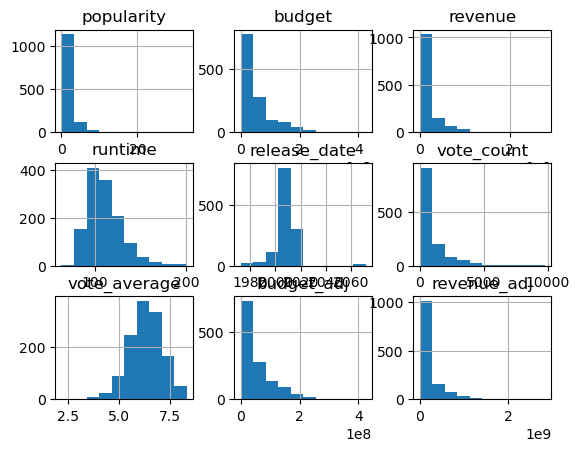

In [28]:
# Viualization our data in histogram shape
df.hist()

<a id='eda'></a>
## Exploratory Data Analysis

* Now, I am going to visualising my Data
### Research Question 1 (Replace this header name!)

# Q1: Showing the trend of budgets of movies throughout years decades.

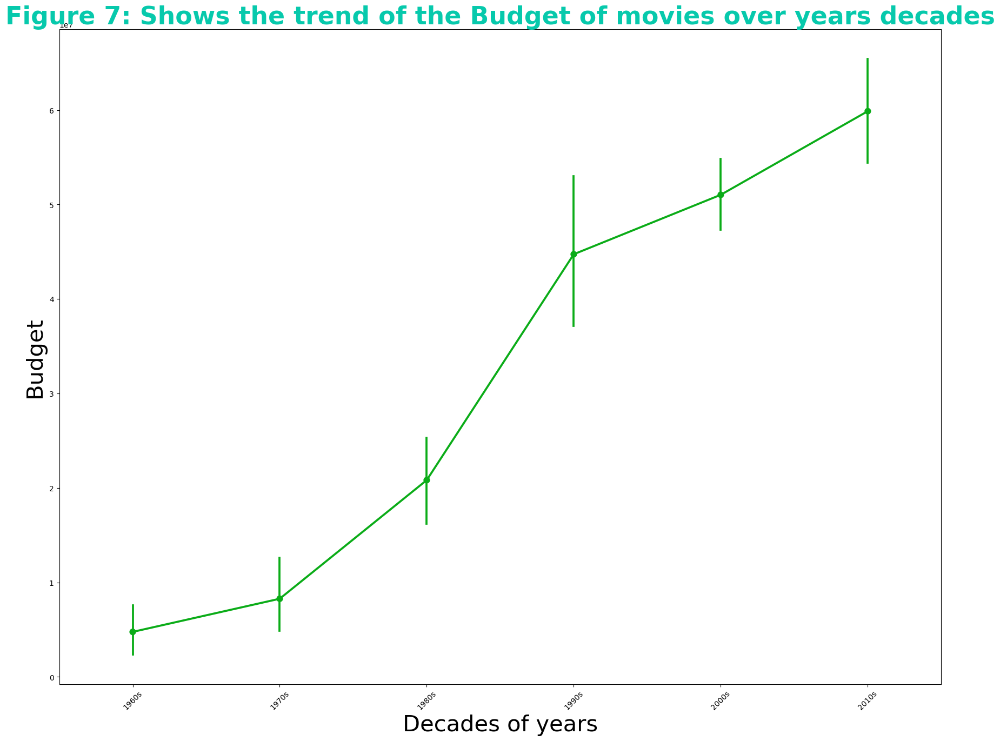

In [29]:
#Showing the trend of Budgets through Decades
plt.figure(figsize=(17,13))
#Assigning axises values
x = df['release_year']
y = df['budget']
#Assigning axises formats
sns.pointplot(x=x, y=y, color='#0BAC18')
plt.tight_layout()
plt.xlabel('Decades of years', fontsize=30)
plt.ylabel("Budget", fontsize=30)
plt.title('Figure 7: Shows the trend of the Budget of movies over years decades',fontweight='bold',color='#07C9AC',fontsize=33)
plt.xticks(rotation =45 );

* Q1: answer: we can notice that the highest budget was in 2010 and overall, the period from 2000 to 2010 witnessed a big rise in the budget compared to other periods, and also that means that companies gave a higher interest in movie production in this period mainly.

# Q2: Showing the trend of revenue of movies throughout years decades.


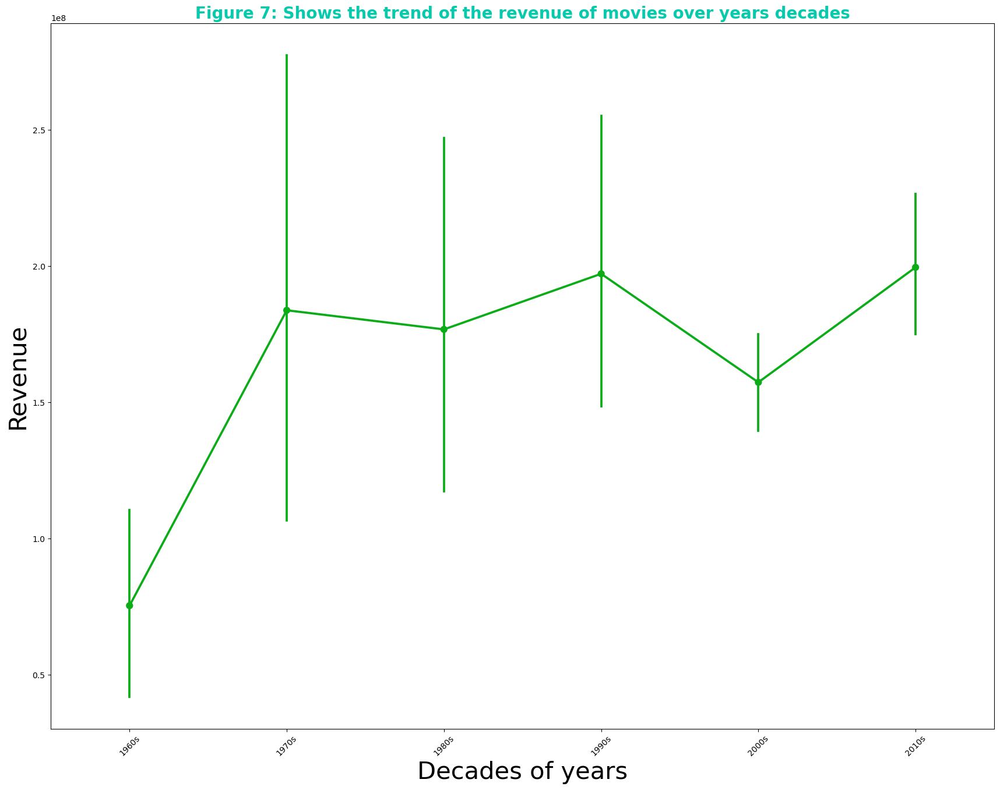

In [30]:
#Showing the trend of Revenue through Decades
#Assigning axises values and formats
plt.figure(figsize=(17,13))
x = df['release_year']
y = df['revenue']
sns.pointplot(x=x, y=y, color='#0BAC18')
plt.tight_layout()
plt.xlabel('Decades of years', fontsize=30)
plt.ylabel("Revenue", fontsize=30)
#Format the title for the chart
plt.title('Figure 7: Shows the trend of the revenue of movies over years decades',fontweight='bold',color='#07C9AC',fontsize=20)
plt.xticks(rotation =45 );

* Q2: Answer:  revenue witnessed rising up and down. From 1960 to 1970 there was a significant rise and a big difference between 1960 and 1970 as in 1960 nearly was no revenue or little revenue.  From 1970 to 2000 was rising up and down but the difference through this period was no big.   The noticed rising up was from 2000 to 2010, it was the highest period in revenue.

* Here spliting cast and genres columns, as their columns have multiple values

In [31]:
#Here spliting cast and genres columns, as their columns have multiple values
def seprate_values(y):
    new_colmns=(df[y].str.split('|', expand=True).rename(columns=lambda x: f"{y}_{x+1}"))
    return new_colmns

In [32]:
df_cast = seprate_values('cast')

In [33]:
df_genre = seprate_values('genres')

In [34]:
df['genres'],df['cast']= df_genre['genres_1'],df_cast['cast_1']

In [35]:
# Counting the number of movies for each genre
df['genres'].value_counts().nlargest(15)

Drama              274
Action             238
Comedy             230
Adventure          130
Horror              78
Thriller            58
Animation           55
Crime               52
Fantasy             44
Science Fiction     38
Romance             26
Family              19
Documentary         14
Mystery             11
War                  8
Name: genres, dtype: int64

In [36]:
# Counting the number of casts
df['cast'].value_counts().nlargest(15)

Tom Hanks               13
Matt Damon              13
Mark Wahlberg           13
Nicolas Cage            13
Tom Cruise              12
George Clooney          11
Johnny Depp             11
Ben Affleck             10
Hugh Jackman            10
Steve Carell            10
Vin Diesel              10
Christian Bale           9
Joseph Gordon-Levitt     9
Jeff Bridges             9
Russell Crowe            9
Name: cast, dtype: int64

# Q3- Showing genres popularity

Text(0.5, 1.0, 'The Most  Popular Genres')

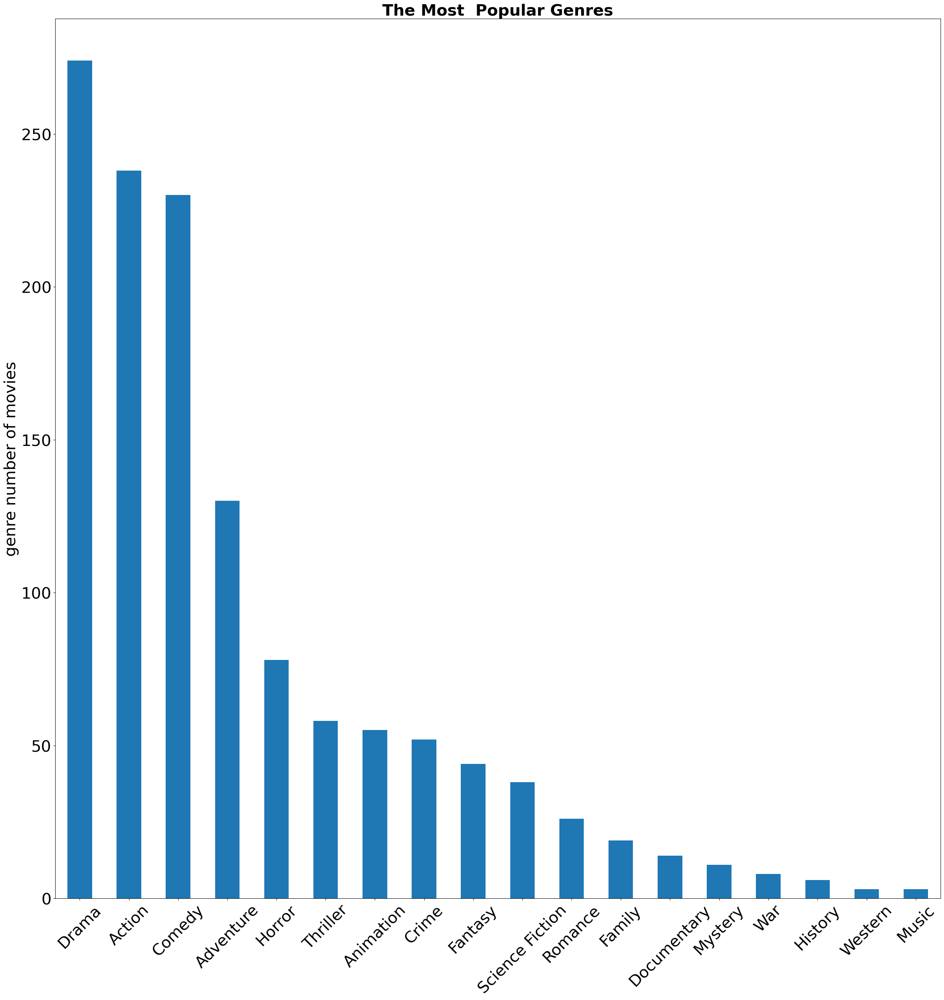

In [37]:
# Counting the most popular geners 
top_df = df.sort_values(by='popularity', ascending=False)
top_genres = pd.Series(top_df['genres'])
frequent_genres_in_top = top_genres.value_counts(ascending=False).head(50)
frequent_genres_in_top.plot(kind='bar', figsize=(30, 30));
# Rotate and format the labels for the x-axis
plt.xticks(rotation = 45, fontsize = 30) 
# Format the y-axis
plt.yticks(fontsize = 30) 
#Asign a title for the y-axis
plt.ylabel("genre number of movies", fontsize = 30) 
#Format the title for the chart
plt.title("The Most  Popular Genres", fontsize = 30, fontweight = "bold") 

* Q3:Answer:  we can see that the top three genres that people like most are drama, action, and comedy. 

* The fourth genre is adventure but somehow there is a significant difference between it and the other three.

* As the figure shows, the rest genres record little popularity, and that leads companies to which genres should produce.

# Q4: Most Popular cast

In [38]:
# Counting the most popular cast 
top_df = df.sort_values(by='vote_count', ascending=False)
top_cast = pd.Series(top_df['cast'])
popular_cast_in_top = top_cast.value_counts(ascending=False).head(30)
popular_cast_in_top.plot(kind='bar', figsize=(190, 160));
# Rotate and format the labels for the x-axis
plt.xticks(rotation = 45, fontsize = 170) 
# Format the y-axis
plt.yticks(fontsize = 170) 
#Asign a title for the y-axis
plt.ylabel("Number of Appearences", fontsize = 170) 
#Format the title for the chart
plt.title("The Highest vote count cast, most popular", fontsize = 170, fontweight = "bold")

Text(0.5, 1.0, 'The Highest vote count cast, most popular')

* Q4:Answer: The figure shows the top 30 actors(cast) that gained the most vote counts and This refers to the actors that people liked the most.
* So that production companies use these actors to produce their films

In [39]:
#Illustrating Genres that are popular through years
df.groupby(["release_year","genres"])['popularity'].size().unstack()

genres,Action,Adventure,Animation,Comedy,Crime,Documentary,Drama,Family,Fantasy,History,Horror,Music,Mystery,Romance,Science Fiction,Thriller,War,Western
release_year,,,,,,,,,,,,,,,,,,
1960s,2,4,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1970s,2,7,0,2,0,0,5,0,0,0,5,0,0,0,0,0,0,0
1980s,7,16,0,2,0,0,2,0,1,0,3,0,0,0,3,1,0,0
1990s,17,9,4,13,4,0,23,3,4,1,3,0,2,4,3,5,0,0
2000s,110,56,28,144,22,10,150,8,25,3,41,2,4,13,15,21,2,2
2010s,100,38,23,67,26,4,94,8,14,2,26,1,5,9,17,31,6,1


# Q5: Genres popularity throughout years

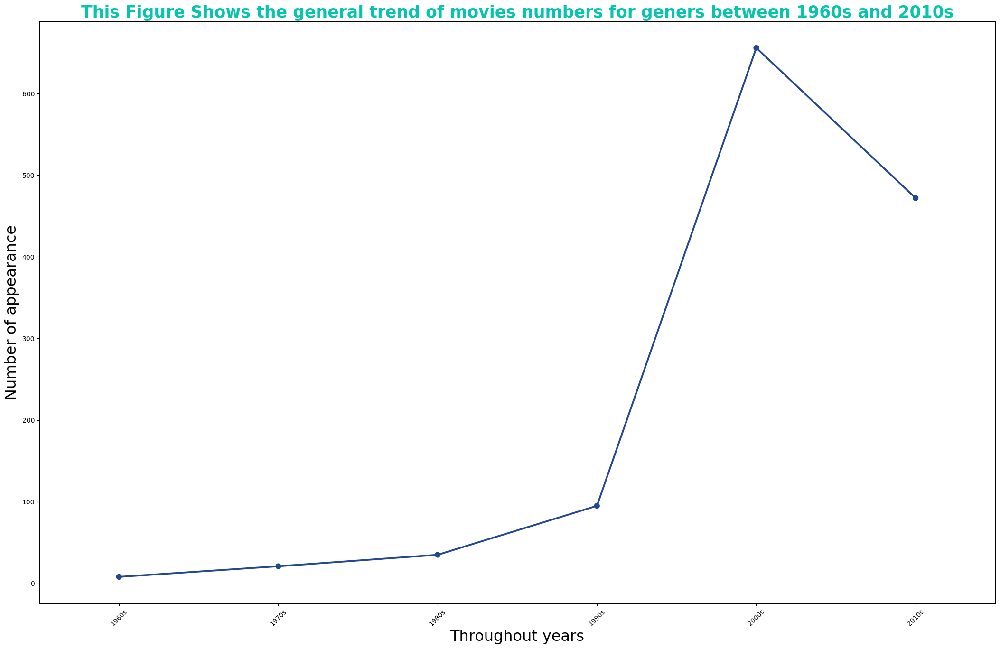

In [40]:
# Creating dataset contains the Number of movies for genres through years:
release_data = pd.DataFrame(df.groupby('release_year')['genres'].count().reset_index())
release_data.rename(columns = {'genres':'Number of movies for genres through years'}, inplace = True)
#Formatting figure size
plt.figure(figsize=(21,13))
#Assigning x and y axsises values
x = release_data['release_year']
y = release_data['Number of movies for genres through years']
#setting formats
sns.pointplot(x=x, y=y, color='#234790')
plt.tight_layout()
plt.xlabel('Throughout years', fontsize=23)
plt.ylabel("Number of appearance", fontsize=23)
#formating title 
plt.title('This Figure Shows the general trend of movies numbers for geners between 1960s and 2010s',fontweight='bold',color='#07C5AC',fontsize=25)
plt.xticks(rotation =45 );

* Q5: Answer: The period from 1990 to 2000 witnessed a huge rising in the number of movie genres produced, and that means a big interest in producing a set of different genres of movies in this period, and the following period was from 2000 to 2010. 
* That means also: from 2000 to 2010 there was an interest in producing a specific movie genres.

# Q6: Illustrating genre kinds trend that producted throughout years

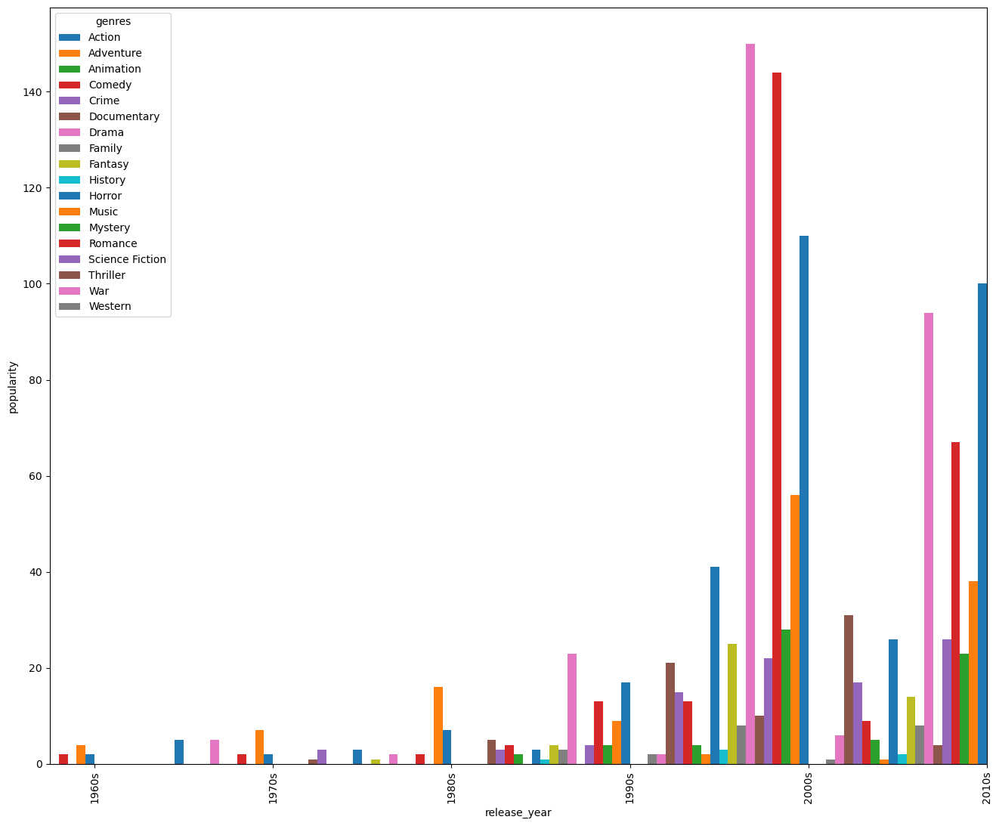

In [41]:
#formating our figure
#Visuaizing the most popular genre throughout years
fig, ax = plt.subplots(figsize=(16,13))
df.groupby(["release_year","genres"])['popularity'].size().unstack().plot(kind='bar',ax=ax,width=-.9,align='edge');
#Assigning y axsis values
ax.set_ylabel('popularity');

* Q6: Answer: In this figure we illustrate movie genres that were produced in each period and their number of production.
* the highest two periods were

1- 1960 To 1970: Action, adventure, comedy,and drama.

2- 1970 To 1980: documentary, science fiction, horror, fantasy, drama, comedy, adventure, crime.

3- 1980 To 1990: documentary, science fiction, horror, fantasy, drama, comedy, adventure, crime, animation, history

The highest two periods and these two periods witnessed a huge rising in number of genres and number of movies for each genre. 

  level 1: 1990 To 2000:the highest 3 genres were: drama, action, and comedy.
  
  level 2: 2000 To 2010:the highest 3 genres were: drama, action, and comedy.
  
  Note: The period from 1990 To 2000 was higher than period from 2000 to 2010 in genres production.

# Q7: The Most Mopular Director

In [42]:
# Counting the most popular Director
top_df = df.sort_values(by='popularity', ascending=False)
top_director = pd.Series(top_df['director'])
popular_top_director = top_director.value_counts(ascending=False).head(20)
popular_top_director.plot(kind='bar', figsize=(160, 130),color='#09C8AC');
# Rotate and format the labels for the x-axis
plt.xticks(rotation = 45, fontsize = 130) 
# Format the y-axis
plt.yticks(fontsize = 130) 
#Asign a title for the y-axis
plt.ylabel("popularity level", fontsize = 130) 
#Format the title for the chart
plt.title("The Most  Popular Director", fontsize = 130, fontweight = "bold")

Text(0.5, 1.0, 'The Most  Popular Director')

*  Q7:Answer: The figure shows the top 20 director that gained the most popularity and This refers to the director that people liked the most.

    So that production companies use these directors to produce their movies.
    
 * The top three director are called:
 
          1- John Carpenter.
          
          2- Steven Spielberg.
          
          3- Steven Soderbergh.



# Q8: Movies with higher revenue

In [43]:
def find_minmax(x):
    #use the function 'idmin' to find the index of lowest profit movie.
    min_index = df[x].idxmin()
    #use the function 'idmax' to find the index of Highest profit movie.
    high_index = df[x].idxmax()
    high = pd.DataFrame(df.loc[high_index,:])
    low = pd.DataFrame(df.loc[min_index,:])
    
    #print the movie with high and low profit
    print("Movie Which Has Highest "+ x + " : ",df['original_title'][high_index])
    print("Movie Which Has Lowest "+ x + "  : ",df['original_title'][min_index])
    return pd.concat([high,low],axis = 1)

In [44]:
#find the min and max movie revenue
find_minmax('revenue')

Movie Which Has Highest revenue :  Avatar
Movie Which Has Lowest revenue  :  Boy


,19995,39356
popularity,9.432768,0.028456
budget,237000000,3
revenue,2781505847,43
original_title,Avatar,Boy
cast,Sam Worthington,James Rolleston
director,James Cameron,Taika Waititi
runtime,162,87
genres,Action,Drama
release_date,2009-12-10 00:00:00,2010-02-14 00:00:00
vote_count,8458,26


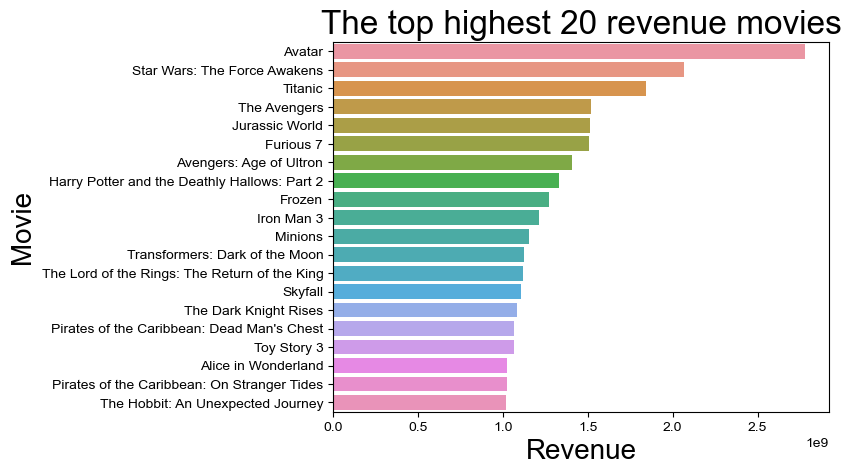

In [45]:
#top 20 movies which made highest revenue.
#sort the 'revenue' column in decending order and store it in the new dataframe.
info = pd.DataFrame(df['revenue'].sort_values(ascending = False))
info['original_title'] = df['original_title']
data = list(map(str,(info['original_title'])))

#extract the top 20 movies with high revenue data from the list and dataframe.
x = list(data[:20])
y = list(info['revenue'][:20])

#Assign the point plot and setup the title and labels.
ax= sns.barplot(x=y,y=x)
sns.set(rc={'figure.figsize':(17,19)})
ax.set_title("The top highest 20 revenue movies",fontsize = 24)
ax.set_xlabel("Revenue",fontsize = 20)
ax.set_ylabel("Movie",fontsize = 20)

sns.set_style("whitegrid")

* Q8: Answer: In this figure we are showing the top higher 20 movies in revenue.

    we can state here the top 5 with higher revenue as an example:

      1- Avatar
      2- Star Wars
      3- Titanics
      4- The avengers
      5- Jurassic world
   

# Q9: Movies with higher budget

In [46]:
#find the min and max movie budget
find_minmax('budget')

Movie Which Has Highest budget :  The Warrior's Way
Movie Which Has Lowest budget  :  Love, Wedding, Marriage


,46528,59296
popularity,0.25054,0.52043
budget,425000000,1
revenue,11087569,1378
original_title,The Warrior's Way,"Love, Wedding, Marriage"
cast,Kate Bosworth,Mandy Moore
director,Sngmoo Lee,Dermot Mulroney
runtime,100,90
genres,Adventure,Comedy
release_date,2010-12-02 00:00:00,2011-06-03 00:00:00
vote_count,74,55


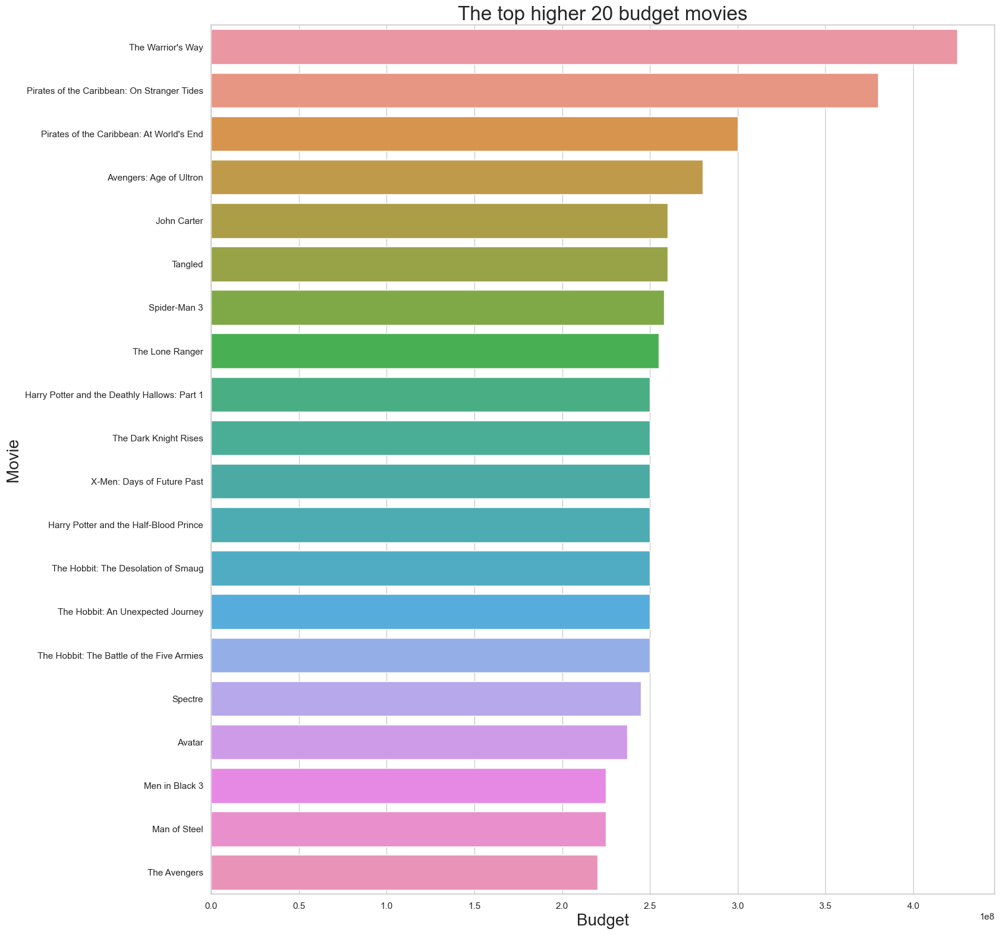

In [47]:
#top 20 movies which has the  highest budget.
#sort the 'budget' column in decending order and store it in the new dataframe.
info = pd.DataFrame(df['budget'].sort_values(ascending = False))
info['original_title'] = df['original_title']
data = list(map(str,(info['original_title'])))

#extract the top 20 movies with the highest budget data from the list and dataframe.
x = list(data[:20])
y = list(info['budget'][:20])

#make the point plot and setup the title and labels.
ax= sns.barplot(x=y,y=x)
sns.set(rc={'figure.figsize':(17,19)})
ax.set_title("The top higher 20 budget movies",fontsize = 24)
ax.set_xlabel("Budget",fontsize = 20)
ax.set_ylabel("Movie",fontsize = 20)

sns.set_style("whitegrid")

 

    * Q9: Answer: In this figure, we are showing the top higher 20 movies in budget.

    we can state here the top 5 with higher revenue as an example:

    1- The Warrior’s Way
    2- Pirates of the Caribbean: On stranger Tides
    3- Pirates of the Caribbean: At World’s End
    4- Avengers: Age of Ultron
    5- John Carte



# Q10: Here we illustrate the relation between popularity and profit and how can popularity affect on profits of the movie.

Correlation Between Popularity And Profit :  0.5820644762668434


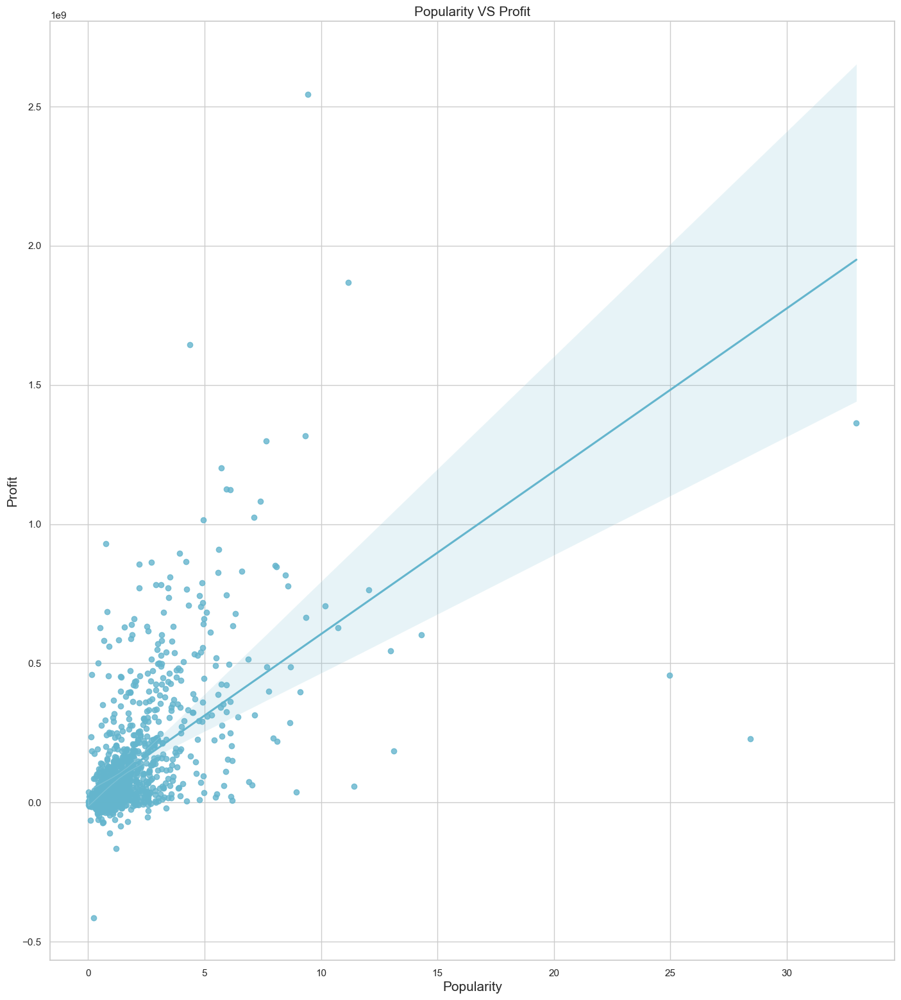

In [48]:
#first: we create a new df that is called profit depending on the revenue and budget
df['Profit'] = df['revenue'] - df['budget']
#Then Asigning the figure type
ax = sns.regplot(x=df['popularity'],y=df['Profit'],color='c')

#After then Asigning the title and the labels of the scatter plot.
ax.set_title("Popularity VS Profit",fontsize=15)
ax.set_xlabel("Popularity",fontsize=15)
ax.set_ylabel("Profit",fontsize=15)

#Asigning the size of figure.
sns.set(rc={'figure.figsize':(7,11)})
sns.set_style("whitegrid")

#Exploring the correlation between the Two Factor.
data_corr = df.corr()

print("Correlation Between Popularity And Profit : ",data_corr.loc['popularity','Profit'])

* Q10: Answer: Through this figure, we illustrate the correlation between popularity and profits.

      As shown we can see a positive correlation.
      
      The correlation is 0.58 or 0.6.
      
      That means the movie with high popularity achieves high profits.
      

# Q11: Showing how can runtime factor affect on the movie popularity(The Colleration between them)

Correlation between Runtime and Popularity  :  0.3223899491346069


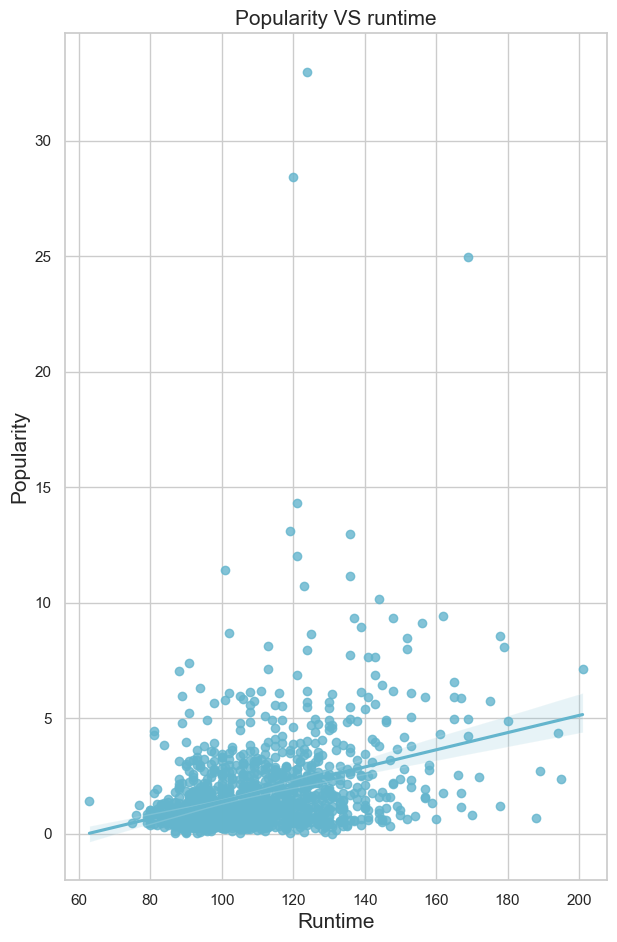

In [49]:
#Then Asigning the figure type
ax = sns.regplot(x=df['runtime'],y=df['popularity'],color='c')

#After then Asigning the title and the labels of the scatter plot.
ax.set_title("Popularity VS runtime",fontsize=15)
ax.set_xlabel("Runtime",fontsize=15)
ax.set_ylabel("Popularity",fontsize=15)

#Asigning the size of figure.
sns.set(rc={'figure.figsize':(7,11)})
sns.set_style("whitegrid")

#Exploring the correlation between the Two Factor.
data_corr = df.corr()

print("Correlation between Runtime and Popularity  : ",data_corr.loc['runtime','popularity'])



    * Q11: Answer: Through this figure, we illustrate the correlation between runtime and popularity.

    As shown we can see a positive correlation.

    The correlation is 0.32 or 0.3.

    That means the movie with longer runtime gain less popularity and the more popular runtime was between 80 minutes
    and 140 minutes.



# Q12: Showing the relation between budget and revenue (The Colleration between them)

Correlation between Revenue and Budget  :  0.7068884353090439


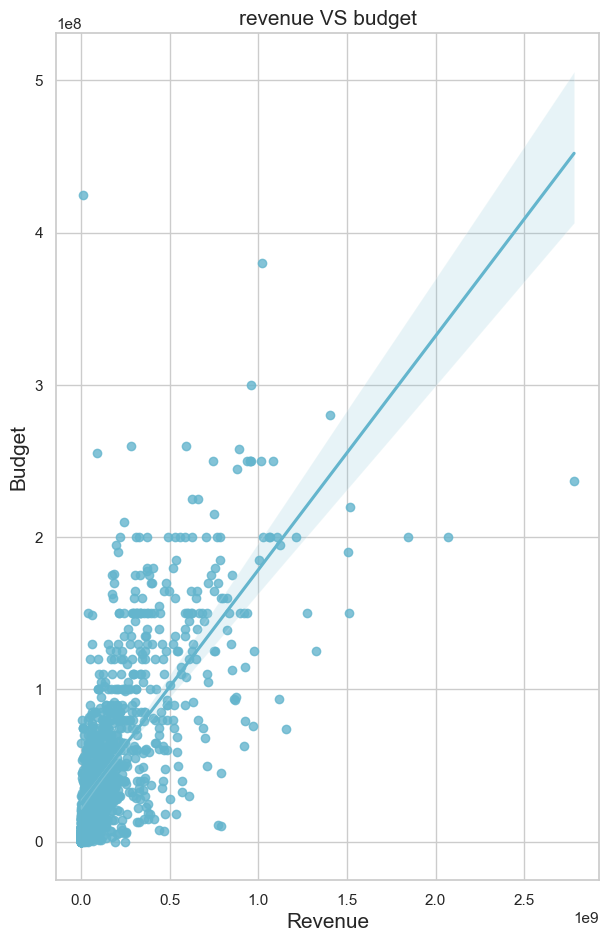

In [50]:
#Then Asigning the figure type
ax = sns.regplot(x=df['revenue'],y=df['budget'],color='c')

#After then Asigning the title and the labels of the scatter plot.
ax.set_title("revenue VS budget",fontsize=15)
ax.set_xlabel("Revenue",fontsize=15)
ax.set_ylabel("Budget",fontsize=15)

#Asigning the size of figure.
sns.set(rc={'figure.figsize':(7,11)})
sns.set_style("whitegrid")

#Exploring the correlation between the Two Factor.
data_corr = df.corr()

print("Correlation between Revenue and Budget  : ",data_corr.loc['revenue','budget'])

* Q12: Answer: Through this figure, we illustrate the correlation between budget and revenue.

    As shown we can see a positive correlation.

    The correlation is 0.70 or 0.7.

    That means good-budget movie tends to achieve success.

<a id='conclusions'></a>
## Conclusions

1- Analysis results
   * we recommend companies should have a good budget to achieve good revenue.
   
   * We recommend also producing more movies focusing on action, drama, and comedy genres because these three 
     genres achieved the most popularity.
     
   * We advise companies to produce movies with no long runtime because it will be boring and will not achieve 
     any popularity and the best runtime to produce is between 80 to 140 minutes.
     
   * There was a noticed increase in interest in producing movies and their investments over time.
   
   * we can notice also that interest in specific genres varies all over time so we need to study every 
     period's interests so we go in the right way and increase our profits.
     
    
2- Analysis Limitation
   * Data has many missing values (Nan) and zero values so I had to drop them to have an appropriate investigation.
     That led to a loss of 50% of the dataset nearly. The budget, revenue, and runtime have many zero values
     and I do not think that these variables have zero values in the real world.
  
   * I think it will be better if we depend on many resources to collect our data to avoid missing values
      and achieve better web scrapping to have data with good quality for better investigation.
      
   * There were some columns that have multiple values so I had to split them to make the dataset better reading.
   
   * Data is outdated, we can not use it to gain information for this recent times or make any decisions
     through it as there is a huge transformation and difference that happened the last years and still
     happening now, compared to the past, now we have more streaming services such as Netflix, Disney Plus and more.
     
   * I haven't taken into consideration about revenue and budget of the movie associated in terms of 2010 dollars,
      accounting for inflation over time. 

